In [67]:
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN
from scipy.stats import pearsonr
import roicat
# from roicat.tracking.alignment import Aligner
import os
from pathlib import Path
import multiprocessing as mp
import tempfile
import matplotlib.pyplot as plt
from typing import Optional, Sequence, Iterable, Any


In [68]:
# Main folder for the animal
mousename = 'MZ_CA1_WD_M5'
sourcedir = r'Z:\2p\experiment1'

In [69]:
# ----------------------
# STEP 1: Load Suite2p Data Using ROICAT Loader
# ----------------------

# 1) make folder paths containing the stat.npy files and ops.npy files
dir_allOuterFolders = os.path.join(sourcedir,mousename)

pathSuffixToStat = 'stat.npy' # cell's spatial info, shape etc
pathSuffixToOps = 'ops.npy' # program loading/running setting file 
pathSuffixToIscell = 'iscell.npy' # is cell flags for future use

paths_all_stat = roicat.helpers.find_paths(
    dir_outer=dir_allOuterFolders,
    reMatch=pathSuffixToStat,
    depth=10,
)[:]
paths_all_ops  = [str(Path(path).resolve().parent / pathSuffixToOps) for path in paths_all_stat]
paths_all_iscell  = [str(Path(path).resolve().parent / pathSuffixToIscell) for path in paths_all_stat]

print(f'paths to all stat files:')
[print(path) for path in paths_all_stat]
print('')
print(f'paths to all ops files:')
[print(path) for path in paths_all_ops]

paths to all stat files:
Z:\2p\experiment1\MZ_CA1_WD_M5\d1\suite2p\combined\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d1\suite2p\plane0\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d1\suite2p\plane1\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d1\suite2p\plane2\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d1\suite2p\plane3\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d2\suite2p\combined\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d2\suite2p\plane0\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d2\suite2p\plane1\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d2\suite2p\plane2\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d2\suite2p\plane3\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d3\suite2p\combined\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d3\suite2p\plane0\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d3\suite2p\plane1\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d3\suite2p\plane2\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d4\suite2p\combined\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d4\suite2p\plane0\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d4\suite

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [83]:
# Load paths to stat and ops files into ROICAT
# planes = ['plane2', 'plane0', 'plane0', 'plane0', 'plane0', 'plane0', 'plane0', 'plane0', 'plane0']  # Adjusted for your example
# planes = ['plane1'] * 9  # 'plane1' repeated 9 times
planes = ['plane3' , 'plane2', 'plane2', 'plane2', 'plane2', 'plane2', 'plane2', 'plane2', 'plane2']
days = [1, 3, 4, 5, 6, 7, 8, 9, 10]

# Initialize lists to accumulate paths
paths_stat = []
paths_ops = []
paths_iscell = []

for plane, day in zip(planes, days):
    # Filter paths for the current plane and day
    stat_path = [x for x in paths_all_stat if plane in x and f'd{day}\\' in x]
    ops_path = [x for x in paths_all_ops if plane in x and f'd{day}\\' in x]
    iscell_path = [x for x in paths_all_iscell if plane in x and f'd{day}\\' in x]

    # Append the filtered paths to the respective lists
    paths_stat.extend(stat_path)
    paths_ops.extend(ops_path)
    paths_iscell.extend(iscell_path)


print(f'paths to all stat files:')
[print(path) for path in paths_stat]
print(f'paths to all ops files:')
[print(path) for path in paths_ops]
print(f'paths to all iscell files:')
[print(path) for path in paths_iscell]

paths to all stat files:
Z:\2p\experiment1\MZ_CA1_WD_M5\d1\suite2p\plane3\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d3\suite2p\plane2\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d4\suite2p\plane2\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d5\suite2p\plane2\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d6\suite2p\plane2\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d7\suite2p\plane2\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d8\suite2p\plane2\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d9\suite2p\plane2\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_M5\d10\suite2p\plane2\stat.npy
paths to all ops files:
\\10.52.18.221\Mingkang\2p\experiment1\MZ_CA1_WD_M5\d1\suite2p\plane3\ops.npy
\\10.52.18.221\Mingkang\2p\experiment1\MZ_CA1_WD_M5\d3\suite2p\plane2\ops.npy
\\10.52.18.221\Mingkang\2p\experiment1\MZ_CA1_WD_M5\d4\suite2p\plane2\ops.npy
\\10.52.18.221\Mingkang\2p\experiment1\MZ_CA1_WD_M5\d5\suite2p\plane2\ops.npy
\\10.52.18.221\Mingkang\2p\experiment1\MZ_CA1_WD_M5\d6\suite2p\plane2\ops.npy
\\10.52.18.221\Mingkang\2p\experiment1

[None, None, None, None, None, None, None, None, None]

In [84]:
# 3) Load data with roicat suite2p data loader
data = roicat.data_importing.Data_suite2p(
    paths_statFiles=paths_stat[:],
    paths_opsFiles=paths_ops[:],
    um_per_pixel=3.0,  ## IMPORTANT PARAMETER. Use a list of floats if values differ in each session.
    new_or_old_suite2p='new',
    type_meanImg='meanImgE', # raw mean image across all registered frames
)

# assert data.check_completeness(verbose=False)['tracking'], f"Data object is missing attributes necessary for tracking."


Starting: Importing FOV images from ops files
Completed: Set FOV_height and FOV_width successfully.
Completed: Imported 9 FOV images.
Setting FOV_images...
Completed: Set FOV_images for 9 sessions successfully.
Importing spatial footprints from stat files.


  0%|          | 0/9 [00:00<?, ?it/s]

Imported 9 sessions of spatial footprints into sparse arrays.
Completed: Set spatialFootprints for 9 sessions successfully.
Completed: Created session_bool.
Completed: Created centroids.
Starting: Creating centered ROI images from spatial footprints...
Completed: Created ROI images.


In [79]:
### Optional things in between

# Subselecting ROIs that are only cells, not suggested intially but can do 
# data.remove_rois_by_classLabel(classLabel_to_keep=1, verbose=True)

# Visualizing FOV images
# roicat.visualization.display_toggle_image_stack(data.FOV_images)
# roicat.visualization.display_toggle_image_stack(data.get_maxIntensityProjection_spatialFootprints(), clim=[0,1])
# roicat.visualization.display_toggle_image_stack(np.concatenate(data.ROI_images, axis=0)[:5000], image_size=(200,200))

DEVICE = roicat.helpers.set_device(use_GPU=True)
SEED = roicat.util.set_random_seed(seed=None, deterministic=False)  ## Deterministic algorithms have issues, but are useful for debugging, testing, and reproducing results.

Using device: cpu


In [80]:
# ----------------------
# Can skip to STEP 5 if already have saved data
# STEP 2: Align images across sessions and correct them
# ----------------------

# 1) load the aligner 
aligner = roicat.tracking.alignment.Aligner(
    use_match_search=True,  ## Use our algorithm for doing all-pairs matching if template matching fails.
    all_to_all=False,  ## Force the use of our algorithm for all-pairs matching. Much slower (False: O(N) vs. True: O(N^2)), but more accurate.
    radius_in=4,  ## IMPORTANT PARAMETER: Value in micrometers used to define the maximum shift/offset between two images that are considered to be aligned. Larger means more lenient alignment.
    radius_out=20,  ## Value in micrometers used to define the minimum shift/offset between two images that are considered to be misaligned.
    z_threshold=4,  ## IMPORTANT PARAMETER: Z-score required to define two images as aligned. Larger values results in more stringent alignment requirements.
    um_per_pixel=data.um_per_pixel[0],  ## Single value for um_per_pixel. data.um_per_pixel is typically a list of floats, so index out just one value.
    device=DEVICE,
    verbose=True,
)


c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\roicat\util.py:416: UserWarning: RH WARNING: unable to get gcc version. Got error: [WinError 2] The system cannot find the file specified
  warnings.warn(f'RH WARNING: unable to get gcc version. Got error: {e}')


In [81]:
# 2) Load the augment function to visually enhance the FOV images for alignment 
FOV_images = aligner.augment_FOV_images(
    FOV_images=data.FOV_images, # mean FOV image for each session
    spatialFootprints=data.spatialFootprints,
    normalize_FOV_intensities=True,
    roi_FOV_mixing_factor=0.5, # how much weight the ROI foorprint images has in final image (usually 0.5)
    use_CLAHE=True,  ## IMPORTANT PARAMETER. Use Set to False if data is poor quality or poorly aligned.
    CLAHE_grid_block_size=8,  ## IMPORTANT PARAMETER. Use smaller values for higher precision but higher chance of failure.
    CLAHE_clipLimit=1.0,
    CLAHE_normalize=True,
)


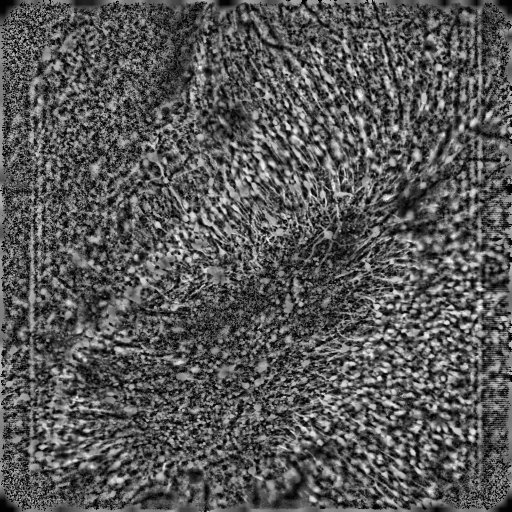

In [82]:
# Visual display of the pre-alignment FOV images
roicat.visualization.display_toggle_image_stack(FOV_images)

In [35]:
# 3) Align the FOVs based on geometric transformation
reference_image = 4

aligner.fit_geometric(
    template=reference_image,  ## specifies which image to use as the template. Either array (image), integer (ims_moving index), or float (ims_moving fractional index)
    ims_moving=FOV_images,  ## input images
    template_method='sequential',  ## 'sequential': align images to neighboring images (good for drifting data). 'image': align to a single image
    mask_borders=(0, 0, 0, 0),  ## number of pixels to mask off the edges (top, bottom, left, right)
    method='DISK_LightGlue',  ## See below for options.
    kwargs_method = {
        'RoMa': {  ## Accuracy: Best, Speed: Very slow (can be fast with a GPU).
            'model_type': 'outdoor',
            'n_points': 10000,  ## Higher values mean more points are used for the registration. Useful for larger FOV_images. Larger means slower.
            'batch_size': 1000,
        },
        'DISK_LightGlue': {  ## Accuracy: Good, Speed: Fast.
            'num_features': 3000,  ## Number of features to extract and match. I've seen best results around 2048 despite higher values typically being better.
            'threshold_confidence': 0.0,  ## Higher values means fewer but better matches.
            'window_nms': 7,  ## Non-maximum suppression window size. Larger values mean fewer non-suppressed points.
        },
        'LoFTR': {  ## Accuracy: Okay. Speed: Medium.
            'model_type': 'indoor_new',
            'threshold_confidence': 0.2,  ## Higher values means fewer but better matches.
        },
        'ECC_cv2': {  ## Accuracy: Okay. Speed: Medium.
            'mode_transform': 'euclidean',  ## Must be one of {'translation', 'affine', 'euclidean', 'homography'}. See cv2 documentation on findTransformECC for more details.
            'n_iter': 200,
            'termination_eps': 1e-09,  ## Termination criteria for the registration algorithm. See documentation for more details.
            'gaussFiltSize': 1,  ## Size of the gaussian filter used to smooth the FOV_image before registration. Larger values mean more smoothing.
            'auto_fix_gaussFilt_step': 10,  ## If the registration fails, then the gaussian filter size is reduced by this amount and the registration is tried again.
        },
        'PhaseCorrelation': {  ## Accuracy: Poor. Speed: Very fast. Notes: Only applicable for translations, not rotations or scaling.
            'bandpass_freqs': [1, 30],
            'order': 5,
        },
    },
    kwargs_RANSAC = {
        'inl_thresh': 3.0,  ## cv2.findHomography RANSAC inlier threshold. Larger values mean more lenient matching.
        'max_iter': 100,
        'confidence': 0.99,
    },
    verbose=True,  ## Set to 3 to view plots of the alignment process if available for the method.
)

Loaded LightGlue model


Finding geometric registration warps:   0%|          | 0/9 [00:00<?, ?it/s]

Alignment z_in scores: [2.3, 46.3, 57.0, 32.8, 33948835840.0, 32.2, 15.8, 19.5, 30.6]. z_threshold: 4.
Attempting to find best matches using match search algorithm...
Finding alignment between images idx: [0] and all other images...


Finding geometric registration warps:   0%|          | 0/9 [00:00<?, ?it/s]

c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\roicat\tracking\alignment.py:1453: UserWarning: number of points is less than needed for homography transform. len(kptsA)=2
  warnings.warn(f"number of points is less than needed for homography transform. len(kptsA)={len(kptsA)}")
c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\roicat\tracking\alignment.py:1453: UserWarning: number of points is less than needed for homography transform. len(kptsA)=0
  warnings.warn(f"number of points is less than needed for homography transform. len(kptsA)={len(kptsA)}")


Finding alignment between remaining images and all other images: [1, 2, 3, 4, 5, 6, 7, 8]...


c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\roicat\tracking\alignment.py:577: UserWarning: Warning: Could not find a path to alignment for image idx: [0]. Now doing a dense search for alignment between all images...
  warnings.warn(f'Warning: Could not find a path to alignment for image idx: {idx_no_path}. Now doing a dense search for alignment between all images...')


Finding geometric registration warps:   0%|          | 0/9 [00:00<?, ?it/s]

Finding geometric registration warps:   0%|          | 0/9 [00:00<?, ?it/s]

Finding geometric registration warps:   0%|          | 0/9 [00:00<?, ?it/s]

Finding geometric registration warps:   0%|          | 0/9 [00:00<?, ?it/s]

Finding geometric registration warps:   0%|          | 0/9 [00:00<?, ?it/s]

Finding geometric registration warps:   0%|          | 0/9 [00:00<?, ?it/s]

Finding geometric registration warps:   0%|          | 0/9 [00:00<?, ?it/s]

Finding geometric registration warps:   0%|          | 0/9 [00:00<?, ?it/s]

All images aligned successfully after dense search.


[array([[[ 32.57846659, -15.10590827],
         [ 33.59407395, -15.00881842],
         [ 34.60968131, -14.91172857],
         ...,
         [549.52261388,  34.31282411],
         [550.53822124,  34.40991396],
         [551.5538286 ,  34.50700381]],
 
        [[ 32.49422613, -14.09229005],
         [ 33.50983349, -13.9952002 ],
         [ 34.52544086, -13.89811035],
         ...,
         [549.43837342,  35.32644233],
         [550.45398078,  35.42353218],
         [551.46958814,  35.52062203]],
 
        [[ 32.40998567, -13.07867183],
         [ 33.42559304, -12.98158198],
         [ 34.4412004 , -12.88449213],
         ...,
         [549.35413296,  36.34006055],
         [550.36974033,  36.4371504 ],
         [551.38534769,  36.53424025]],
 
        ...,
 
        [[-10.29992606, 500.82576595],
         [ -9.28431869, 500.9228558 ],
         [ -8.26871133, 501.01994565],
         ...,
         [506.64422123, 550.24449833],
         [507.65982859, 550.34158818],
         [508.67543596,


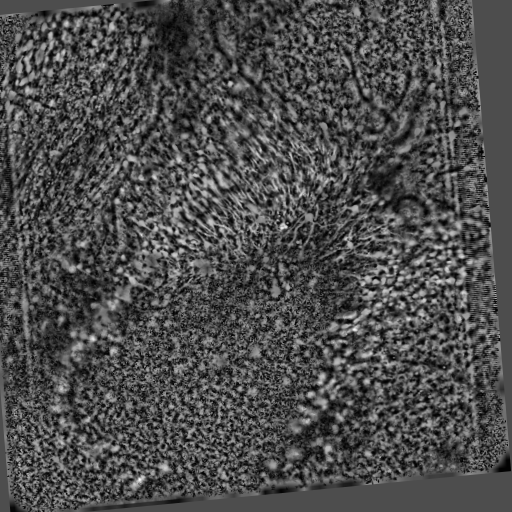

In [43]:
roicat.visualization.display_toggle_image_stack(aligner.ims_registered_geo)

(<Figure size 600x300 with 3 Axes>, <Figure size 600x300 with 3 Axes>)

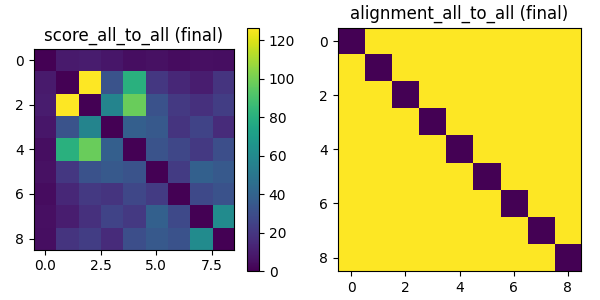

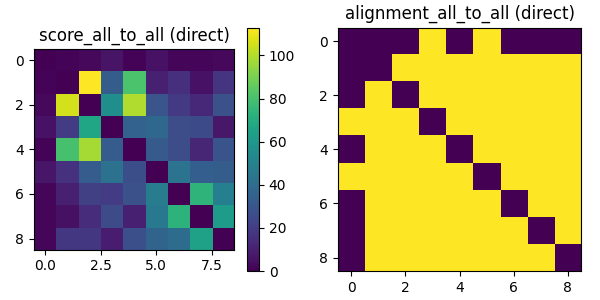

In [44]:
aligner.plot_alignment_results_geometric()

In [45]:
# 4) Non-rigid transformation 
aligner.fit_nonrigid(
    template=reference_image,  ## specifies which image to use as the template. Either array (image), integer (ims_moving index), or float (ims_moving fractional index)
    ims_moving=aligner.ims_registered_geo,  ## Input images. Typically the geometrically registered images
    remappingIdx_init=aligner.remappingIdx_geo,  ## The remappingIdx between the original images (and ROIs) and ims_moving
    template_method='image',  ## 'sequential': align images to neighboring images. 'image': align to a single image, good if using geometric registration first
    method='DeepFlow',
    kwargs_method = {
        'DeepFlow': {},  ## Accuracy: Good (good in middle, poor on edges), Speed: Fast (CPU only)
        'RoMa': {  ## Accuracy: Okay (decent in middle, poor on edges), Speed: Slow (can be fast with a GPU), Notes: This method can work on the raw images without pre-registering using geometric methods.
            'model_type': 'outdoor',
        },
        'OpticalFlowFarneback': {  ## Accuracy: Varies (can sometimes be tuned to be the best as there are no edge artifacts), Speed: Medium (CPU only)
            'pyr_scale': 0.7,
            'levels': 5,
            'winsize': 256,
            'iterations': 15,
            'poly_n': 5,
            'poly_sigma': 1.5,            
        },
    },    
)

aligner.transform_images_nonrigid(FOV_images)

Finding nonrigid registration warps with mode: DeepFlow, template_method: image


Finding nonrigid registration warps:   0%|          | 0/9 [00:00<?, ?image/s]

Composing nonrigid warp matrices...
Applying nonrigid registration warps to images...


[array([[0.19214024, 0.19214024, 0.19214024, ..., 0.19214024, 0.19214024,
         0.19214024],
        [0.19214024, 0.19214024, 0.19214024, ..., 0.19214024, 0.19214024,
         0.19214024],
        [0.19214024, 0.19214024, 0.19214024, ..., 0.19214024, 0.19214024,
         0.19214024],
        ...,
        [0.19214024, 0.19214024, 0.19214024, ..., 0.19214024, 0.19214024,
         0.19214024],
        [0.19214024, 0.19214024, 0.19214024, ..., 0.19214024, 0.19214024,
         0.19214024],
        [0.19214024, 0.19214024, 0.19214024, ..., 0.19214024, 0.19214024,
         0.19214024]], shape=(512, 512), dtype=float32),
 array([[0.18556665, 0.18556665, 0.18556665, ..., 0.18556665, 0.18556665,
         0.18556665],
        [0.00638309, 0.00638309, 0.00638309, ..., 0.18556665, 0.18556665,
         0.18556665],
        [0.00597103, 0.00606752, 0.0061579 , ..., 0.18556665, 0.18556665,
         0.18556665],
        ...,
        [0.18556665, 0.18556665, 0.18556665, ..., 0.18556665, 0.18556665,
 

(<Figure size 600x300 with 3 Axes>, None)

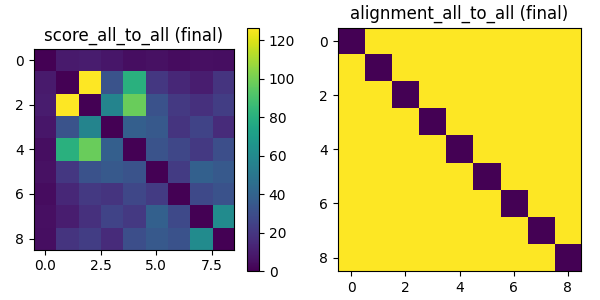

In [46]:
aligner.plot_alignment_results_nonrigid()


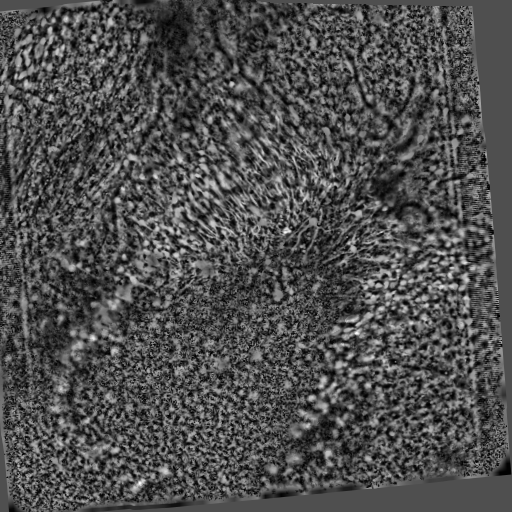

In [47]:
roicat.visualization.display_toggle_image_stack(aligner.ims_registered_nonrigid)

In [48]:
# 5) Apply the non-rigid spatial transformation to the ROI footprints to align them across sessions in a common space
aligner.transform_ROIs(
    ROIs=data.spatialFootprints, 
    remappingIdx=aligner.remappingIdx_nonrigid,
    # remappingIdx=aligner.remappingIdx_geo,
    normalize=True,
)

Registering ROIs...


Registering ROIs:   0%|          | 0/9 [00:00<?, ?it/s]

[<Compressed Sparse Row sparse matrix of dtype 'float32'
 	with 116747 stored elements and shape (1087, 262144)>,
 <Compressed Sparse Row sparse matrix of dtype 'float32'
 	with 147256 stored elements and shape (994, 262144)>,
 <Compressed Sparse Row sparse matrix of dtype 'float32'
 	with 98617 stored elements and shape (807, 262144)>,
 <Compressed Sparse Row sparse matrix of dtype 'float32'
 	with 75250 stored elements and shape (620, 262144)>,
 <Compressed Sparse Row sparse matrix of dtype 'float32'
 	with 119467 stored elements and shape (994, 262144)>,
 <Compressed Sparse Row sparse matrix of dtype 'float32'
 	with 88586 stored elements and shape (730, 262144)>,
 <Compressed Sparse Row sparse matrix of dtype 'float32'
 	with 157531 stored elements and shape (806, 262144)>,
 <Compressed Sparse Row sparse matrix of dtype 'float32'
 	with 76601 stored elements and shape (668, 262144)>,
 <Compressed Sparse Row sparse matrix of dtype 'float32'
 	with 100951 stored elements and shape (7


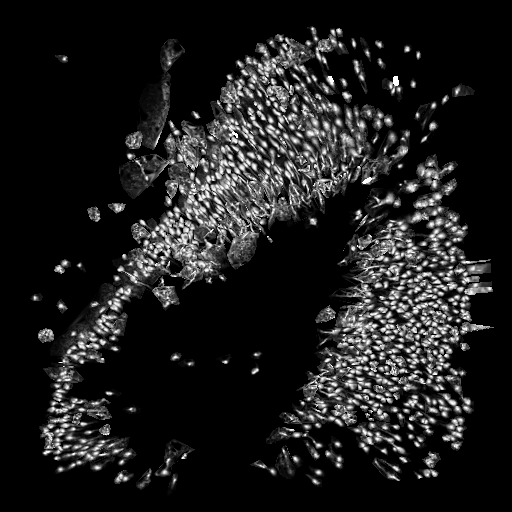

In [49]:
roicat.visualization.display_toggle_image_stack(aligner.get_ROIsAligned_maxIntensityProjection(normalize=True), clim=None)

In [50]:
# 6) Blurring ROI edges to increase the overlap between ROIs that drift apart across sessions. 
# Can increase the kernel_halfWidth if working with sparsely labeled ROIs or ROIs that change or move across sessions.
blurrer = roicat.tracking.blurring.ROI_Blurrer(
    frame_shape=(data.FOV_height, data.FOV_width),  ## FOV height and width
    kernel_halfWidth=4,  ## The half width of the 2D gaussian used to blur the ROI masks
    plot_kernel=False,  ## Whether to visualize the 2D gaussian
)

blurrer.blur_ROIs(
    spatialFootprints=aligner.ROIs_aligned[:],
)

c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\roicat\util.py:416: UserWarning: RH WARNING: unable to get gcc version. Got error: [WinError 2] The system cannot find the file specified
  warnings.warn(f'RH WARNING: unable to get gcc version. Got error: {e}')


Preparing the Toeplitz convolution matrix
Performing convolution for blurring


[<Compressed Sparse Column sparse matrix of dtype 'float32'
 	with 319106 stored elements and shape (1087, 262144)>,
 <Compressed Sparse Column sparse matrix of dtype 'float32'
 	with 337904 stored elements and shape (994, 262144)>,
 <Compressed Sparse Column sparse matrix of dtype 'float32'
 	with 247167 stored elements and shape (807, 262144)>,
 <Compressed Sparse Column sparse matrix of dtype 'float32'
 	with 188709 stored elements and shape (620, 262144)>,
 <Compressed Sparse Column sparse matrix of dtype 'float32'
 	with 298865 stored elements and shape (994, 262144)>,
 <Compressed Sparse Column sparse matrix of dtype 'float32'
 	with 220621 stored elements and shape (730, 262144)>,
 <Compressed Sparse Column sparse matrix of dtype 'float32'
 	with 319963 stored elements and shape (806, 262144)>,
 <Compressed Sparse Column sparse matrix of dtype 'float32'
 	with 192267 stored elements and shape (668, 262144)>,
 <Compressed Sparse Column sparse matrix of dtype 'float32'
 	with 2418


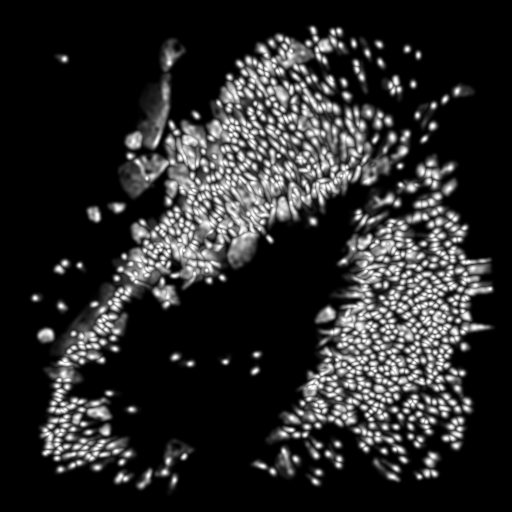

In [51]:
roicat.visualization.display_toggle_image_stack(blurrer.get_ROIsBlurred_maxIntensityProjection())

In [52]:
# ----------------------
# STEP 3: Compute similarities between ROIs
# ----------------------


# 1) Pass through ROI through ROInet neural nework. This is a pretrained neural network used to compute embeddings 
# (feature vectors) for each ROI. These embeddings capture shape, texture, and structure in an abstract, high dimensional
# space. This learned morphology will be used for clustering later.

dir_temp = tempfile.gettempdir()

roinet = roicat.ROInet.ROInet_embedder(
    device=DEVICE,  ## Which torch device to use ('cpu', 'cuda', etc.)
    dir_networkFiles=dir_temp,  ## Directory to download the pretrained network to
    download_method='check_local_first',  ## Check to see if a model has already been downloaded to the location (will skip if hash matches)
    download_url='https://osf.io/x3fd2/download',  ## URL of the model
    download_hash='7a5fb8ad94b110037785a46b9463ea94',  ## Hash of the model file
    forward_pass_version='latent',  ## How the data is passed through the network
    verbose=True,  ## Whether to print updates
)

File does not exist locally: C:\Users\mzhou9\AppData\Local\Temp\1\ROInet.zip. Will attempt download from https://osf.io/x3fd2/download


  0%|          | 0.00/48.9M [00:00<?, ?B/s]

Hash of downloaded file matches hash_hex.
Extracting C:\Users\mzhou9\AppData\Local\Temp\1\ROInet.zip to C:\Users\mzhou9\AppData\Local\Temp\1.
Completed zip extraction.
Imported model from C:\Users\mzhou9\AppData\Local\Temp\1\ROInet_tracking_20220527\model.py
Loaded params_model from C:\Users\mzhou9\AppData\Local\Temp\1\ROInet_tracking_20220527\params.json


c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You can also use `weights=ConvNeXt_Tiny_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Generated network using params_model
Loaded state_dict into network from C:\Users\mzhou9\AppData\Local\Temp\1\ROInet_tracking_20220527\ConvNext_tiny__1_0_best__simCLR.pth
Loaded network onto device cpu


In [53]:
# 2) Resize ROIs and prepare a dataloader
roinet.generate_dataloader(
    ROI_images=data.ROI_images,  ## Input images of ROIs
    um_per_pixel=data.um_per_pixel,  ## Resolution of FOV
    pref_plot=False,  ## Whether or not to plot the ROI sizes
    
    jit_script_transforms=False,  ## (advanced) Whether or not to use torch.jit.script to speed things up
    
    batchSize_dataloader=8,  ## (advanced) PyTorch dataloader batch_size
    pinMemory_dataloader=True,  ## (advanced) PyTorch dataloader pin_memory
    numWorkers_dataloader=mp.cpu_count(),  ## (advanced) PyTorch dataloader num_workers
    persistentWorkers_dataloader=True,  ## (advanced) PyTorch dataloader persistent_workers
    prefetchFactor_dataloader=2,  ## (advanced) PyTorch dataloader prefetch_factor
)

Starting Image Resizer


c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\roicat\util.py:416: UserWarning: RH WARNING: unable to get gcc version. Got error: [WinError 2] The system cannot find the file specified
  warnings.warn(f'RH WARNING: unable to get gcc version. Got error: {e}')


Creating dataloader
Defined image transformations: Sequential(
  (0): ScaleDynamicRange(scaler_bounds=(0, 1))
  (1): Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
  (2): TileChannels(dim=0)
)
Defined dataset
Defined dataloader


array([[[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         0.0000000e+00, 4.6210266e-06, 9.7272123e-06],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         0.0000000e+00, 2.1952733e-06, 4.6210266e-06],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         3.0093454e-06, 0.0000000e+00, 0.0000000e+00],
        ...,
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         3.8902613e-06, 2.0287139e-07, 2.6550879e-06],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],

       [[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [3.5031696e-04, 1.3322638e-04, 0.0000000e+00, ...,
         0.000


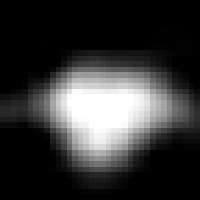

In [54]:
roicat.visualization.display_toggle_image_stack(roinet.ROI_images_rs[:1000], image_size=(200,200))

In [55]:
# 3) Pass through data through the network to store these deep feature embeddings for each ROI
roinet.generate_latents()

starting: running data through network


c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\torch\utils\data\dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


  0%|          | 0/932 [00:02<?, ?it/s]

completed: running data through network


tensor([[147109.4688, -24708.8945, -18983.7930,  ...,  -1972.1530,
           1851.6978, -29384.6328],
        [ 55887.2266, -40501.0234,  17964.8027,  ...,  21078.9082,
          -2783.1997, -16345.3076],
        [ 53697.8047, -27224.7773, -19112.9922,  ...,  15595.9727,
           9442.8281, -11494.7725],
        ...,
        [ 66598.4062, -89392.5547,  32993.2383,  ...,  -8776.3779,
         -32055.0566, -22116.9414],
        [ 32055.6719,  -6696.0107,  22668.9746,  ...,  20884.9844,
         -45446.7070,  11361.5479],
        [-21815.9062, -43636.0820,  40385.3398,  ..., -11454.7490,
         -44019.5234,  -5881.9375]])

In [57]:
# 4) Apply scattering wavelet embedding - deep feature extractor that captures fine-scale image structures like orientation,
# edges and local frequency content. Similar idea as ROInet. 

swt = roicat.tracking.scatteringWaveletTransformer.SWT(
    kwargs_Scattering2D={'J': 2, 'L': 12},  ## 'J' is the number of convolutional layers. 'L' is the number of wavelet angles.
    image_shape=data.ROI_images[0].shape[1:3],  ## size of a cropped ROI image
    device=DEVICE,  ## PyTorch device
)

swt.transform(
    ROI_images=roinet.ROI_images_rs,  ## All the cropped and resized ROI images
    batch_size=100,  ## Batch size for each iteration (smaller is less memory but slower)
)

SWT initialized
Starting: SWT transform on ROIs


  0%|          | 0/74.56 [00:00<?, ?it/s]

Completed: SWT transform on ROIs


tensor([[7.2712e-08, 6.1611e-09, 1.0206e-06,  ..., 5.2902e-05, 3.1911e-05,
         1.1363e-05],
        [6.0245e-05, 9.6464e-06, 6.4426e-06,  ..., 4.7770e-05, 2.4119e-05,
         3.8164e-05],
        [1.2722e-08, 2.7708e-06, 1.1723e-05,  ..., 3.6583e-05, 4.9435e-05,
         3.4089e-05],
        ...,
        [2.4329e-05, 4.6680e-06, 3.1480e-05,  ..., 8.8194e-05, 1.7957e-04,
         1.1789e-04],
        [1.6488e-07, 7.5835e-06, 3.2083e-05,  ..., 7.8193e-05, 5.3370e-05,
         7.8887e-05],
        [1.6784e-03, 7.5339e-03, 1.1528e-02,  ..., 7.2006e-06, 7.3884e-06,
         4.1917e-05]])

c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\roicat\util.py:416: UserWarning: RH WARNING: unable to get gcc version. Got error: [WinError 2] The system cannot find the file specified
  warnings.warn(f'RH WARNING: unable to get gcc version. Got error: {e}')


Computing pairwise similarity between ROIs...


  0%|          | 0/16 [00:00<?, ?it/s]

Joining blocks into full similarity matrices...
Joining s_sf...
Joining s_NN...
Joining s_SWT...
Joining s_sesh...


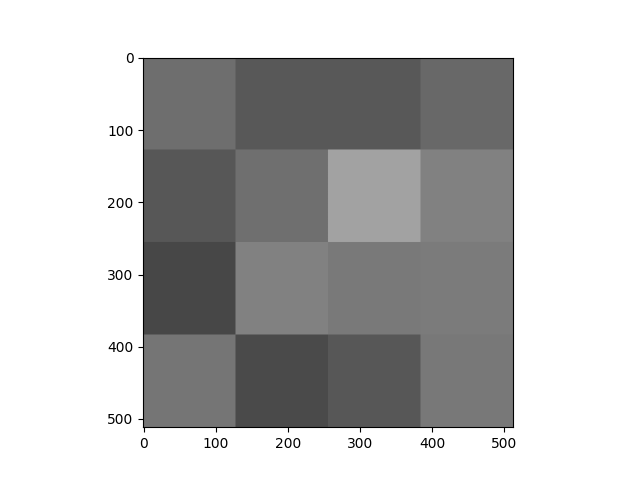

In [58]:
# 5) Compute similarities of ROIs including
# 1. `s_sf`: 'similarity spatial footprint'. The physical overlap between ROIs.
# 2. `s_NN`: 'similarity neural network'. The similarities of the embeddings out of ROInet.
# 3. `s_SWT`: 'similarity scaterring wavelet transform'. The similarities of the embeddings out of the scattering wavelet transformer.
# 4. `s_sesh`: 'similarity sessions'. 0 if from the same session, 1 if from different sessions. ROIs from the same session have 0 probability of being the same.

sim = roicat.tracking.similarity_graph.ROI_graph(
    n_workers=-1,  ## Number of CPU cores to use. -1 for all.
    frame_height=data.FOV_height,
    frame_width=data.FOV_width,
    block_height=128,  ## size of a block
    block_width=128,  ## size of a block
    algorithm_nearestNeigbors_spatialFootprints='brute',  ## algorithm used to find the pairwise similarity for s_sf. ('brute' is slow but exact. See docs for others.)
    verbose=True,  ## Whether to print outputs
)

sim.visualize_blocks()

s_sf, s_NN, s_SWT, s_sesh = sim.compute_similarity_blockwise(
    spatialFootprints=blurrer.ROIs_blurred,  ## Mask spatial footprints
    features_NN=roinet.latents,  ## ROInet output latents
    features_SWT=swt.latents,  ## Scattering wavelet transform output latents
    ROI_session_bool=data.session_bool,  ## Boolean array of which ROIs belong to which sessions
    spatialFootprint_maskPower=1.0,  ##  An exponent to raise the spatial footprints to to care more or less about bright pixels
)

In [59]:
# 6) Normalize the similarity matrix using local ROIs
sim.make_normalized_similarities(
    centers_of_mass=data.centroids,  ## ROI centroid positions
    features_NN=roinet.latents,  ## ROInet latents
    features_SWT=swt.latents,  ## SWT latents
    k_max=data.n_sessions*100,  ## Maximum number of nearest neighbors to consider for the normalizing distribution
    k_min=data.n_sessions*10,  ## Minimum number of nearest neighbors to consider for the normalizing distribution
    algo_NN='kd_tree',  ## Nearest neighbors algorithm to use
    device=DEVICE,
)

Finding k-range of center of mass distance neighbors for each ROI...
Normalizing Neural Network similarity scores...


  0%|          | 0/7456 [00:00<?, ?it/s]

Normalizing SWT similarity scores...


  0%|          | 0/7456 [00:00<?, ?it/s]

In [60]:
# ----------------------
# STEP 4: Clustering
# ----------------------

# 1) Combine the similarity matrices into a single distance matrix 
# This step finds the optimal parameters to mix the similarity matrices by tuning mixing parameters to maximally 
# separate the distributions of pairwise similarities for ROI pairs known to be different and ROI pairs that are likely matched.

# Some of the details of underlying algorithm:
# 1. For each step in the optimization process, all the similarity matrices (`s_sf`, `s_NN_z`, `s_SWT_z`, `s_sesh`) 
# are each passed through a sigmoid activation function that is parameterized (e.g. `'power_SF'`, `'sig_SF_kwargs'`), then all the similarity matrices are combined using a p-norm, where the 'p' is parameterized with `'p_norm'`. 
# This results in a single conjunctive similarity matrix called `sConj` bounded between 0-1. 
# This allows each matrix to emphasize midrange scores and suppress noise in low-similarity mataches.
# 2. `sConj` is converted into a distance matrix `dConj` (bounded from 1-0).
# 3. `dConj` is then passed through the objective function: The full distance matrix is separated into a few components. 
# First, all pairs of ROIs that are known to be from 'different' sources because they are from the same session are separated out into a distribution of pairwise distances (`d_diff`). Second, we define pairs of ROIs that are likely to be from the same source as `d_same` = `d_all` - `d_diff`. The objective function is then the overlap between the `d_diff` and `d_same` distributions. 
# 4. The objective function is minimized by tuning the mixing parameters in `kwargs_makeConjunctiveDistanceMatrix`.
# 5. The output of this step is the optimal `kwargs_makeConjunctiveDistanceMatrix` dictionary.

## Initialize the clusterer object by passing the similarity matrices in
clusterer = roicat.tracking.clustering.Clusterer(
    s_sf=sim.s_sf,
    s_NN_z=sim.s_NN_z,
    s_SWT_z=sim.s_SWT_z,
    s_sesh=sim.s_sesh,
    verbose=1,
)

# Uncomment below to automatically find mixing parameters
kwargs_makeConjunctiveDistanceMatrix_best = clusterer.find_optimal_parameters_for_pruning(
    n_bins=None,  ## Number of bins to use for the histograms of the distributions. If None, then a heuristic is used.
    smoothing_window_bins=None,  ## Number of bins to use to smooth the distributions. If None, then a heuristic is used.
    kwargs_findParameters={
        'n_patience': 300,  ## Number of optimization epoch to wait for tol_frac to converge
        'tol_frac': 0.001,  ## Fractional change below which optimization will conclude
        'max_trials': 1200,  ## Max number of optimization epochs
        'max_duration': 60*10,  ## Max amount of time (in seconds) to allow optimization to proceed for
        'value_stop': 0.0,  ## Goal value. If value equals or goes below value_stop, optimization is stopped.
    },
    bounds_findParameters={
        'power_NN': [0.0, 2.],  ## Bounds for the exponent applied to s_NN
        'power_SWT': [0.0, 2.],  ## Bounds for the exponent applied to s_SWT
        'p_norm': [-5, -0.1],  ## Bounds for the p-norm p value (Minkowski) applied to mix the matrices
        'sig_NN_kwargs_mu': [0., 1.0],  ## Bounds for the sigmoid center for s_NN
        'sig_NN_kwargs_b': [0.1, 1.5],  ## Bounds for the sigmoid slope for s_NN
        'sig_SWT_kwargs_mu': [0., 1.0],  ## Bounds for the sigmoid center for s_SWT
        'sig_SWT_kwargs_b': [0.1, 1.5],  ## Bounds for the sigmoid slope for s_SWT
    },
    n_jobs_findParameters=-1,  ## Number of CPU cores to use (-1 is all cores)
    seed=SEED,  ## Random seed
)

c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\roicat\util.py:416: UserWarning: RH WARNING: unable to get gcc version. Got error: [WinError 2] The system cannot find the file specified
  warnings.warn(f'RH WARNING: unable to get gcc version. Got error: {e}')


Finding mixing parameters using automated hyperparameter tuning...


  0%|          | 0/1200 [00:00<?, ?it/s]

Completed automatic parameter search. Best value found: 8944846.0 with parameters {'power_NN': 1.997921763158183, 'power_SWT': 1.9455075289601975, 'p_norm': -2.364414468330585, 'sig_NN_kwargs': {'mu': 0.9173723006036445, 'b': 1.4990610878900223}, 'sig_SWT_kwargs': {'mu': 0.5459800768544333, 'b': 1.4999730417989674}}


In [61]:
# 2) Prune the distance matrix
# We can remove all connections in the distance graph with probabilities of connection of less than 50%. We estimate this cutoff distance as the cross-over point between the 'same' and 'different' distributions.

# **Important parameter**\
# `stringency`: This value changes the threshold for pruning the distance matrix. A higher value will result in less pruning, and a lower value will result in more pruning. 
# The value will be multiplied by the inferred threshold to get the new one.

clusterer.make_pruned_similarity_graphs(
    d_cutoff=None,  ## Optionally manually specify a distance cutoff
    kwargs_makeConjunctiveDistanceMatrix=kwargs_makeConjunctiveDistanceMatrix_best,
    stringency=1.0,  ## Modifies the threshold for pruning the distance matrix. Higher values result in LESS pruning. New d_cutoff = stringency * truncated d_cutoff.
    convert_to_probability=False,    
)

Pruning similarity graphs with d_cutoff = 0.6119402647018433...


c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\scipy\sparse\_index.py:210: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_arrayXarray(i, j, x)


In [62]:
# 3) Clustering

# There are two methods for clustering: The standard method `.fit` which is based on HDBSCAN, and `.fit_sequentialHungarian` 
# which is an algorithm that is also used by CaImAn based on the Hungarian algorithm. 
# The standard method takes 1-20 minutes and works better when there are many sessions, the Hungarian method takes seconds and works better when there are fewer sessions (<8).

# **Important parameters**:
# - For standard **`.fit`** method:
# 1. `min_cluster_size`: If you only want ROIs clusters with at least a certain number of samples, specify here.
# 2. `n_iter_violationCorrection`: This parameter controls how fast this step takes. Turning it down has mild effects on quality. We use around ***6***.

# - For **`.fit_sequentialHungarian`** method:
# 1. `thresh_cost`: Determines the threshold of how distant two ROIs can be and still be matched. Smaller value is more stringent.

if data.n_sessions >= 6:
    labels = clusterer.fit(
        d_conj=clusterer.dConj_pruned,  ## Input distance matrix
        session_bool=data.session_bool,  ## Boolean array of which ROIs belong to which sessions
        min_cluster_size=2,  ## Minimum number of ROIs that can be considered a 'cluster'
        n_iter_violationCorrection=6,  ## Number of times to redo clustering sweep after removing violations
        split_intraSession_clusters=True,  ## Whether or not to split clusters with ROIs from the same session
        cluster_selection_method='leaf',  ## (advanced) Method of cluster selection for HDBSCAN (see hdbscan documentation)
        d_clusterMerge=None,  ## Distance below which all ROIs are merged into a cluster
        alpha=0.999,  ## (advanced) Scalar applied to distance matrix in HDBSCAN (see hdbscan documentation)
        discard_failed_pruning=True,  ## (advanced) Whether or not to set all ROIs that could be separated from clusters with ROIs from the same sessions to label=-1
        n_steps_clusterSplit=100,  ## (advanced) How finely to step through distances to remove violations
    )

else:
    labels = clusterer.fit_sequentialHungarian(
        d_conj=clusterer.dConj_pruned,  ## Input distance matrix
        session_bool=data.session_bool,  ## Boolean array of which ROIs belong to which sessions
        thresh_cost=0.8,  ## Threshold. Higher values result in more permissive clustering. Specifically, the pairwise metric distance between ROIs above which two ROIs cannot be clustered together.
    )

Fitting with HDBSCAN and splitting clusters with multiple ROIs per session


  0%|          | 0/6 [00:00<?, ?it/s]

c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Initial number of violating clusters: 196


c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\scipy\sparse\_index.py:201: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_arrayXarray_sparse(i, j, x)


Initial number of violating clusters: 126
Initial number of violating clusters: 111
Initial number of violating clusters: 97
Initial number of violating clusters: 98
Initial number of violating clusters: 99


In [63]:
quality_metrics = clusterer.compute_quality_metrics()

In [64]:
labels_squeezed, labels_bySession, labels_bool, labels_bool_bySession, labels_dict = roicat.tracking.clustering.make_label_variants(labels=labels, n_roi_bySession=data.n_roi)

results_clusters = {
    'labels': labels_squeezed,
    'labels_bySession': labels_bySession,
    'labels_dict': labels_dict,
    'quality_metrics': quality_metrics,
}

results_all = {
    "clusters":{
        "labels": roicat.util.JSON_List(labels_squeezed),
        "labels_bySession": roicat.util.JSON_List(labels_bySession),
        "labels_bool": labels_bool,
        "labels_bool_bySession": labels_bool_bySession,
        "labels_dict": roicat.util.JSON_Dict(labels_dict),
        "quality_metrics": roicat.util.JSON_Dict(clusterer.quality_metrics) if hasattr(clusterer, 'quality_metrics') else None,
    },
    "ROIs": {
        "ROIs_aligned": aligner.ROIs_aligned,
        "ROIs_raw": data.spatialFootprints,
        "frame_height": data.FOV_height,
        "frame_width": data.FOV_width,
        "idx_roi_session": np.where(data.session_bool)[1],
        "n_sessions": data.n_sessions,
    },
    "input_data": {
        "paths_stat": data.paths_stat,
        "paths_ops": data.paths_ops,
    },
}

run_data = {
    'data': data.__dict__,
    'aligner': aligner.__dict__,
    'blurrer': blurrer.__dict__,
    'roinet': roinet.__dict__,
    'swt': swt.__dict__,
    'sim': sim.__dict__,
    'clusterer': clusterer.__dict__,
}

params_used = {name: mod['params'] for name, mod in run_data.items()}
# print(results_clusters["labels"])
print(f'Number of clusters: {len(np.unique(results_clusters["labels"]))}')
print(f'Number of discarded ROIs: {(np.array(results_clusters["labels"])==-1).sum()}')
# print(results_all['ROIs']['idx_roi_session'])

Number of clusters: 920
Number of discarded ROIs: 3847


In [66]:
print(data.n_sessions)

9


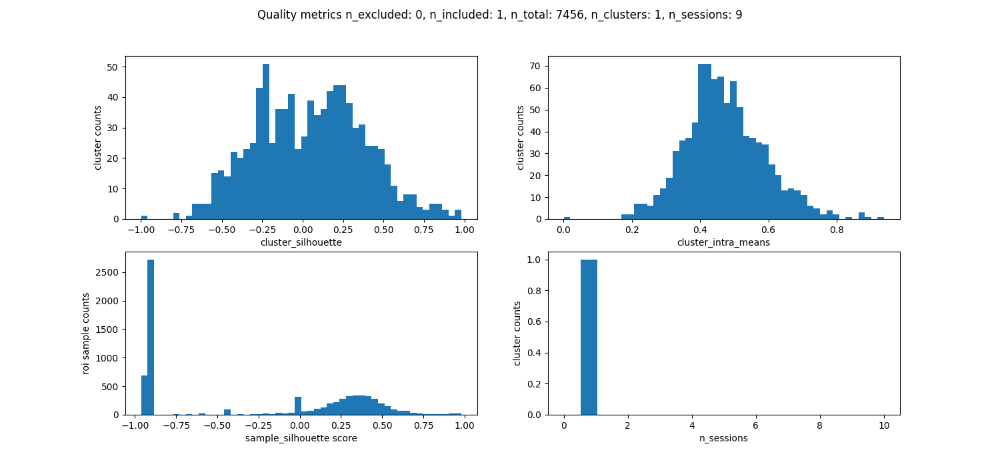

In [65]:
roicat.tracking.clustering.plot_quality_metrics(quality_metrics=quality_metrics, labels=labels_squeezed, n_sessions=data.n_sessions);

In [82]:
# ----------------------
# STEP 5: Analyze and check ROIs 
# ----------------------

# 1) Save the ROIs to a table, -1 if not exist in the session 
# Skip to 2) if ROI_table is already saved

# Make sure labels is a numpy array
labels = np.array(labels)

# Get total number of ROIs
n_total_rois = sum(data.n_roi)

# Find unclustered ROIs (label == -1)
unclustered_indices = np.where(labels == -1)[0]

# Generate unique IDs for each unclustered ROI
max_cluster_id = labels.max()
next_id = max_cluster_id + 1

labels_extended = labels.copy()
for idx in unclustered_indices:
    labels_extended[idx] = next_id
    next_id += 1

roi_sources = []
for sess_idx, n_roi in enumerate(data.n_roi):
    for roi_idx in range(n_roi):
        roi_sources.append((sess_idx, roi_idx))

import pandas as pd

# Build long-format dataframe
df_all = pd.DataFrame({
    'Neuron_ID': labels_extended,
    'Session': [s for s, _ in roi_sources],
    'ROI_Index': [r for _, r in roi_sources]
})

# # Pivot to wide format
# ROI_table_full = df_all.pivot_table(index='Neuron_ID', columns='Session', values='ROI_Index', aggfunc='first')
# ROI_table_full = ROI_table_full.fillna(-1).astype(int)
# ROI_table_full.to_csv(os.path.join(dir_allOuterFolders, f"ROI_table_full_{plane}.csv"))

In [38]:
# 2) Load ROI table from existing saved file
ROI_table_full = pd.read_csv(os.path.join(dir_allOuterFolders, f"ROI_table_full_{plane}.csv"))

In [39]:
def filter_neurons_by_session_count(
    df: pd.DataFrame,
    count: int,
    session_cols: Optional[Sequence] = None,
    absent_values: Optional[Iterable[Any]] = None,
    exact: bool = True  # New parameter to specify exact or at least
) -> pd.DataFrame:
    """
    Filter neurons (rows) by the exact or at least number of sessions in which they appear.

    Assumptions:
    - The first column is the neuron_ID.
    - Remaining columns are session columns (0..n).
    - A neuron is absent in a session if the cell is NaN, -1 (int), or "-1" (str).

    Params:
    - count: exact number of sessions the neuron must appear in (or at least if exact is False).
    - session_cols: optional list of session column names; defaults to all except the first column.
    - absent_values: optional iterable of values that indicate absence; defaults to [-1, "-1"].
    - exact: if True, filter for exact count; if False, filter for at least count.

    Returns:
    - A filtered copy of df containing only rows with exactly or at least `count` present sessions.
    """
    if session_cols is None:
        session_cols = df.columns[1:]  # exclude neuron_ID column

    if absent_values is None:
        absent_values = (-1, "-1")

    sess = df[session_cols]

    # Build mask of "absent" entries: NaN OR equals any of the absent_values
    absent_mask = sess.isna()
    for v in absent_values:
        absent_mask = absent_mask | sess.eq(v)

    # Present if not absent
    present_counts = (~absent_mask).sum(axis=1)

    if exact:
        sel = present_counts.eq(count)
    else:
        sel = present_counts.ge(count)  # Use greater than or equal for at least

    return df.loc[sel].copy()

In [41]:
session_number = 7
ROI_table = filter_neurons_by_session_count(ROI_table_full, count=session_number, exact=False)
# pd.set_option('display.max_rows', None)
print(len(ROI_table), f"neurons with {session_number} sessions")

205 neurons with 7 sessions


In [22]:
# print(data.FOV_images[0])
# print(len(np.unique(data.FOV_images)))
print(np.shape(data.spatialFootprints[0][0]))

(1, 262144)


In [23]:
print(ROI_table.columns)

Index(['Neuron_ID', '0', '1', '2', '3', '4', '5', '6', '7', '8'], dtype='object')


C:\Users\mzhou9\AppData\Local\Temp\1\ipykernel_31236\1295040773.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap(cmap_name, n)


IndexError: Index dimension must be 1 or 2

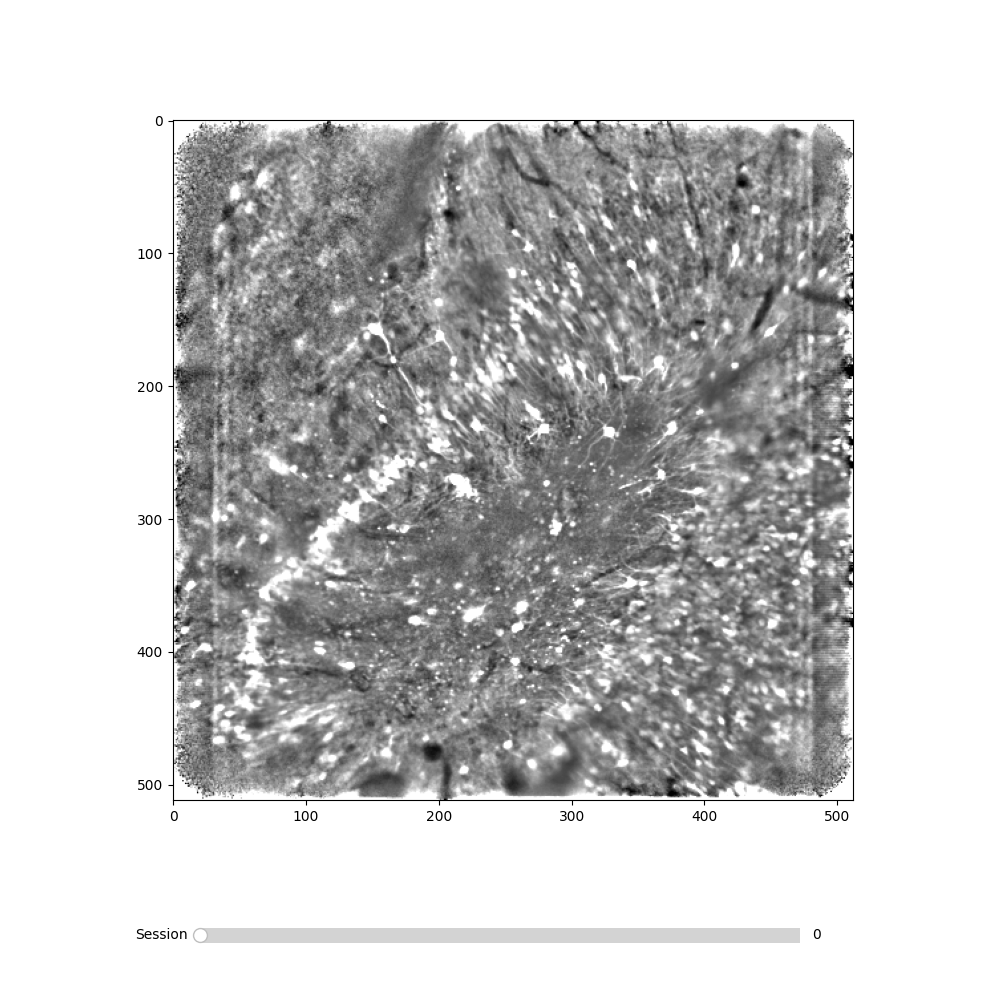

IndexError: Index dimension must be 1 or 2

IndexError: Index dimension must be 1 or 2

IndexError: Index dimension must be 1 or 2

IndexError: Index dimension must be 1 or 2

In [42]:
%matplotlib widget
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider
import numpy as np
from matplotlib.cm import get_cmap
import random

# Function to generate Suite2p-like colors for ROIs
from matplotlib.cm import get_cmap
import numpy as np

def generate_roi_colors_by_row(ROI_table, cmap_name="tab20"):
    n = len(ROI_table)
    if n == 0:
        return []
    # Discrete colormap with n entries; each cmap(i) returns an RGBA tuple
    cmap = get_cmap(cmap_name, n)
    return [list(map(float, cmap(i))) for i in range(n)]

roi_colors = generate_roi_colors_by_row(ROI_table)

# Function to update the plot based on the slider value
def plot_ROIs_across_sessions(session_idx, ROI_table):
    ax.clear()  # Clear the current plot

    # Get the FOV image for the selected session
    fov_image = data.FOV_images[session_idx]

    # Get the spatial footprints for the selected session
    session_footprints = data.spatialFootprints[session_idx]

    # Get the ROI indices to include from the ROI_table
    column_name = str(session_idx)  # Convert session_idx to string
    roi_indices = ROI_table.loc[:, column_name].values  # Use .loc with the column name as a string

    # Reshape the flattened spatial footprint to match the FOV image dimensions
    fov_shape = fov_image.shape  # (height, width)

    # Plot the FOV image
    ax.imshow(fov_image, cmap='gray')  # Display the FOV image

    # Overlay each ROI
    for ir, roi_idx in enumerate(roi_indices):  # Iterate over rows (ROIs)
        # Extract the ROI's spatial footprint as a sparse row
        roi_footprint = session_footprints[roi_idx, :].toarray().reshape(fov_shape)
        roi_color = roi_colors[ir]  # Get the color from the generated color map
        
        # Get the coordinates of non-zero pixels in the ROI
        ypix, xpix = np.nonzero(roi_footprint)

        # Plot the ROI
        ax.plot(xpix, ypix, '.', markersize=1, color=roi_color)

    # Customize the plot
    ax.set_title(f"ROIs for Session {session_idx}")
    ax.set_xlabel("X (pixels)")
    ax.set_ylabel("Y (pixels)")

    fig.canvas.draw_idle()  # Redraw the canvas


# Generate consistent colors for all ROIs
roi_colors = generate_roi_colors_by_row(ROI_table)
sessions_to_include = list(range(data.n_sessions))

# Create the figure and axis
fig, ax = plt.subplots(figsize=(10, 10))
plt.subplots_adjust(bottom=0.2)  # Adjust space for the slider

# Add a slider below the plot
ax_slider = plt.axes([0.2, 0.05, 0.6, 0.03])  # Position of the slider
slider = Slider(ax_slider, 'Session', 0, len(sessions_to_include) - 1, valinit=0, valstep=1)

# Function to update the plot when the slider value changes
def update_plot(val):
    session_idx = sessions_to_include[int(slider.val)]  # Map slider value to session index
    plot_ROIs_across_sessions(session_idx, ROI_table)  # Update the plot

# Connect the slider to the update function
slider.on_changed(update_plot)

# Initialize the plot with the first session
plot_ROIs_across_sessions(0, ROI_table)

plt.show()